Image loaded successfully
Image shape: (3770, 5306, 3)
Image type: uint8


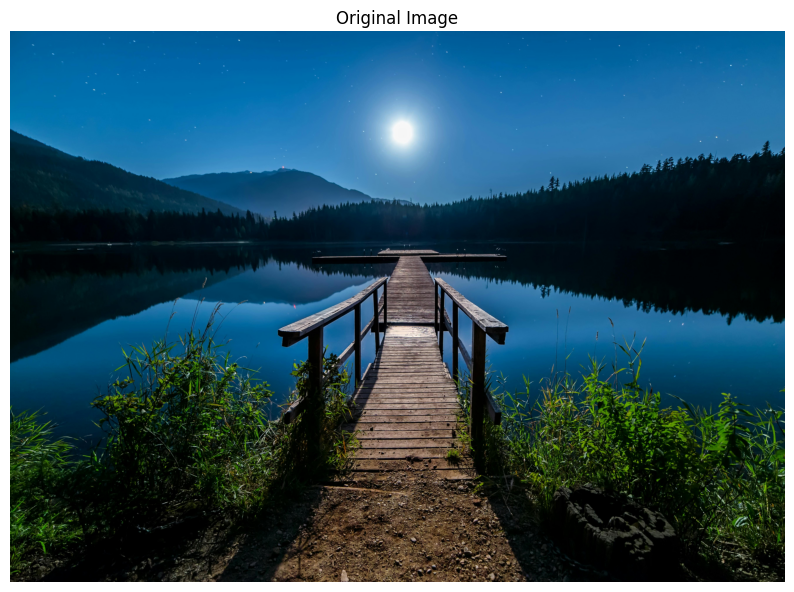

Image saved successfully as saved_image.jpg
Image dimensions: 5306x3770 pixels
Number of channels: 3
Image size: 60010860 pixels
Image data type: uint8
Maximum pixel value: 255
Minimum pixel value: 0


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def main():
    # Read an image
    # Replace 'image.jpg' with your image path
    image = cv2.imread('./image.png')
    
    # Check if image was successfully loaded
    if image is None:
        print('Error: Could not load image')
        return
    
    print('Image loaded successfully')
    print(f'Image shape: {image.shape}')
    print(f'Image type: {image.dtype}')
    
    # Display image using OpenCV
    cv2.imshow('Original Image', image)
    cv2.waitKey(0)  # Wait for any key press
    cv2.destroyAllWindows()
    
    # Display image using Matplotlib
    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
    plt.title('Original Image')
    plt.axis('off')
    plt.show()
    
    # Save the image
    cv2.imwrite('saved_image.jpg', image)
    print('Image saved successfully as saved_image.jpg')
    
    # Get image properties
    height, width = image.shape[:2]
    print(f'Image dimensions: {width}x{height} pixels')
    print(f'Number of channels: {image.shape[2]}')
    print(f'Image size: {image.size} pixels')
    print(f'Image data type: {image.dtype}')
    print(f'Maximum pixel value: {np.max(image)}')
    print(f'Minimum pixel value: {np.min(image)}')

if __name__ == "__main__":
    main()

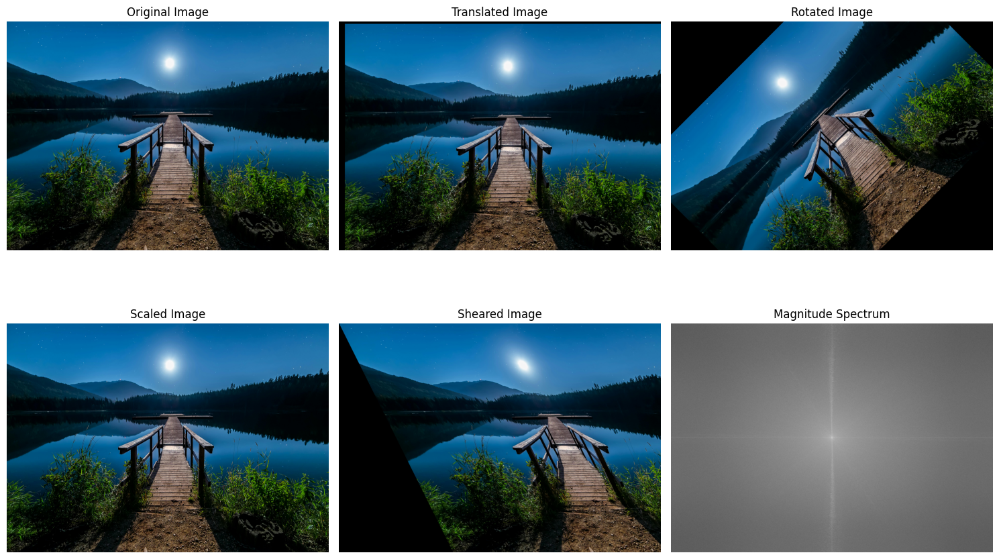

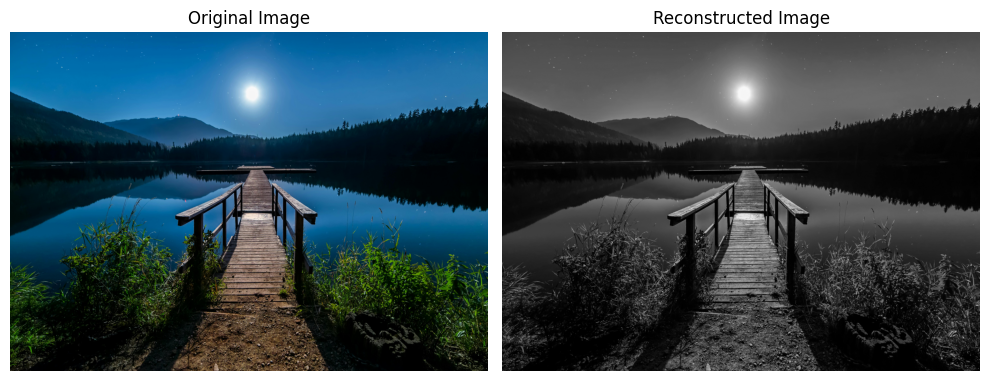

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_geometric_transformations(image):
    # Get image dimensions
    height, width = image.shape[:2]
    
    # 1. Translation
    translation_matrix = np.float32([[1, 0, 100], [0, 1, 50]])
    translated = cv2.warpAffine(image, translation_matrix, (width, height))
    
    # 2. Rotation
    center = (width//2, height//2)
    rotation_matrix = cv2.getRotationMatrix2D(center, 45, 1.0)
    rotated = cv2.warpAffine(image, rotation_matrix, (width, height))
    
    # 3. Scaling
    scaled = cv2.resize(image, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_LINEAR)
    
    # 4. Shearing
    shear_matrix = np.float32([[1, 0.5, 0], [0, 1, 0]])
    sheared = cv2.warpAffine(image, shear_matrix, (width, height))
    
    return translated, rotated, scaled, sheared

def apply_frequency_domain_operations(image):
    # Convert image to grayscale if it's not already
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    # Apply 2D DFT
    dft = cv2.dft(np.float32(gray), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    
    # Calculate magnitude spectrum
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]))
    
    # Apply inverse DFT
    f_ishift = np.fft.ifftshift(dft_shift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])
    
    return magnitude_spectrum, img_back

def main():
    # Read the image
    image = cv2.imread('./image.png')
    if image is None:
        print('Error: Could not load image')
        return
    
    # Apply geometric transformations
    translated, rotated, scaled, sheared = apply_geometric_transformations(image)
    
    # Apply frequency domain operations
    magnitude_spectrum, reconstructed = apply_frequency_domain_operations(image)
    
    # Display results
    plt.figure(figsize=(15, 10))
    
    # Original image
    plt.subplot(231)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    # Translated image
    plt.subplot(232)
    plt.imshow(cv2.cvtColor(translated, cv2.COLOR_BGR2RGB))
    plt.title('Translated Image')
    plt.axis('off')
    
    # Rotated image
    plt.subplot(233)
    plt.imshow(cv2.cvtColor(rotated, cv2.COLOR_BGR2RGB))
    plt.title('Rotated Image')
    plt.axis('off')
    
    # Scaled image
    plt.subplot(234)
    plt.imshow(cv2.cvtColor(scaled, cv2.COLOR_BGR2RGB))
    plt.title('Scaled Image')
    plt.axis('off')
    
    # Sheared image
    plt.subplot(235)
    plt.imshow(cv2.cvtColor(sheared, cv2.COLOR_BGR2RGB))
    plt.title('Sheared Image')
    plt.axis('off')
    
    # Magnitude spectrum
    plt.subplot(236)
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title('Magnitude Spectrum')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Display reconstructed image
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(122)
    plt.imshow(reconstructed, cmap='gray')
    plt.title('Reconstructed Image')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

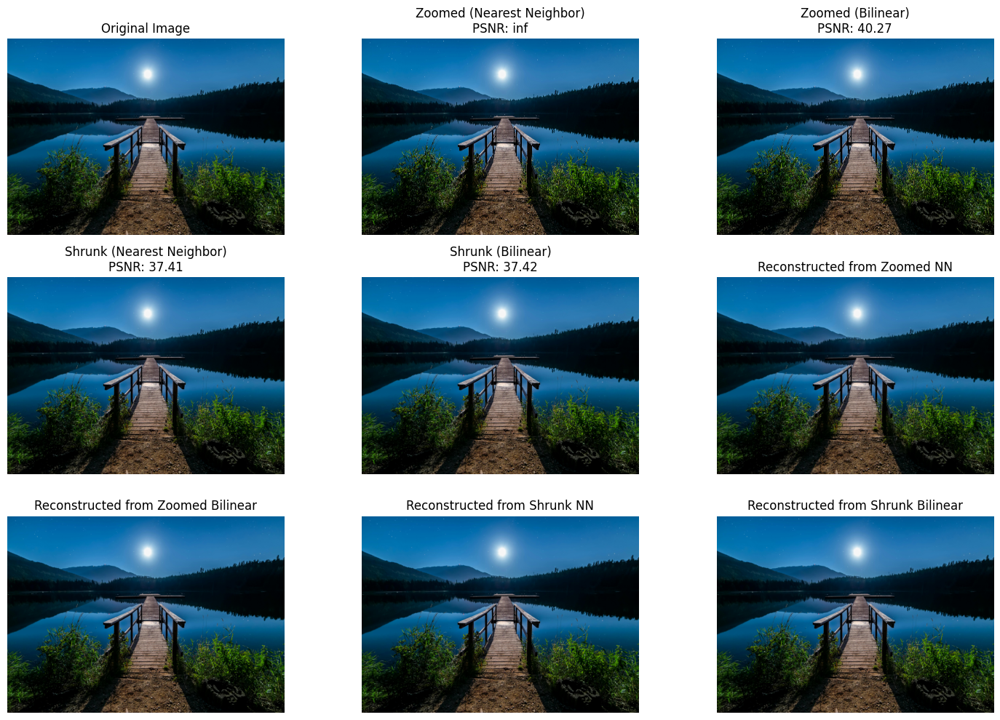


PSNR Values:
Zoomed (Nearest Neighbor): inf dB
Zoomed (Bilinear): 40.27 dB
Shrunk (Nearest Neighbor): 37.41 dB
Shrunk (Bilinear): 37.42 dB


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def zoom_shrink_comparison(image, zoom_factor=2.0, shrink_factor=0.5):
    """
    Compare different interpolation methods for zooming and shrinking
    """
    # Get original dimensions
    height, width = image.shape[:2]
    
    # Calculate new dimensions
    zoom_width = int(width * zoom_factor)
    zoom_height = int(height * zoom_factor)
    shrink_width = int(width * shrink_factor)
    shrink_height = int(height * shrink_factor)
    
    # Zoom using different interpolation methods
    zoomed_nn = cv2.resize(image, (zoom_width, zoom_height), 
                          interpolation=cv2.INTER_NEAREST)
    zoomed_bilinear = cv2.resize(image, (zoom_width, zoom_height), 
                                interpolation=cv2.INTER_LINEAR)
    
    # Shrink using different interpolation methods
    shrunk_nn = cv2.resize(image, (shrink_width, shrink_height), 
                          interpolation=cv2.INTER_NEAREST)
    shrunk_bilinear = cv2.resize(image, (shrink_width, shrink_height), 
                                interpolation=cv2.INTER_LINEAR)
    
    # Resize back to original size for comparison
    zoomed_nn_back = cv2.resize(zoomed_nn, (width, height), 
                              interpolation=cv2.INTER_NEAREST)
    zoomed_bilinear_back = cv2.resize(zoomed_bilinear, (width, height), 
                                    interpolation=cv2.INTER_NEAREST)
    shrunk_nn_back = cv2.resize(shrunk_nn, (width, height), 
                              interpolation=cv2.INTER_NEAREST)
    shrunk_bilinear_back = cv2.resize(shrunk_bilinear, (width, height), 
                                    interpolation=cv2.INTER_NEAREST)
    
    return (zoomed_nn, zoomed_bilinear, shrunk_nn, shrunk_bilinear,
            zoomed_nn_back, zoomed_bilinear_back, shrunk_nn_back, shrunk_bilinear_back)

def calculate_psnr(original, processed):
    """
    Calculate Peak Signal-to-Noise Ratio between original and processed images
    """
    mse = np.mean((original - processed) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

def main():
    # Read the image
    image = cv2.imread('./image.png')
    if image is None:
        print('Error: Could not load image')
        return
    
    # Convert to RGB for display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Apply zooming and shrinking with different interpolation methods
    results = zoom_shrink_comparison(image)
    zoomed_nn, zoomed_bilinear, shrunk_nn, shrunk_bilinear, \
    zoomed_nn_back, zoomed_bilinear_back, shrunk_nn_back, shrunk_bilinear_back = results
    
    # Convert results to RGB for display
    zoomed_nn_rgb = cv2.cvtColor(zoomed_nn, cv2.COLOR_BGR2RGB)
    zoomed_bilinear_rgb = cv2.cvtColor(zoomed_bilinear, cv2.COLOR_BGR2RGB)
    shrunk_nn_rgb = cv2.cvtColor(shrunk_nn, cv2.COLOR_BGR2RGB)
    shrunk_bilinear_rgb = cv2.cvtColor(shrunk_bilinear, cv2.COLOR_BGR2RGB)
    
    # Calculate PSNR values
    psnr_zoomed_nn = calculate_psnr(image, zoomed_nn_back)
    psnr_zoomed_bilinear = calculate_psnr(image, zoomed_bilinear_back)
    psnr_shrunk_nn = calculate_psnr(image, shrunk_nn_back)
    psnr_shrunk_bilinear = calculate_psnr(image, shrunk_bilinear_back)
    
    # Display results
    plt.figure(figsize=(15, 10))
    
    # Original image
    plt.subplot(331)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    # Zoomed images
    plt.subplot(332)
    plt.imshow(zoomed_nn_rgb)
    plt.title(f'Zoomed (Nearest Neighbor)\nPSNR: {psnr_zoomed_nn:.2f}')
    plt.axis('off')
    
    plt.subplot(333)
    plt.imshow(zoomed_bilinear_rgb)
    plt.title(f'Zoomed (Bilinear)\nPSNR: {psnr_zoomed_bilinear:.2f}')
    plt.axis('off')
    
    # Shrunk images
    plt.subplot(334)
    plt.imshow(shrunk_nn_rgb)
    plt.title(f'Shrunk (Nearest Neighbor)\nPSNR: {psnr_shrunk_nn:.2f}')
    plt.axis('off')
    
    plt.subplot(335)
    plt.imshow(shrunk_bilinear_rgb)
    plt.title(f'Shrunk (Bilinear)\nPSNR: {psnr_shrunk_bilinear:.2f}')
    plt.axis('off')
    
    # Reconstructed images
    plt.subplot(336)
    plt.imshow(cv2.cvtColor(zoomed_nn_back, cv2.COLOR_BGR2RGB))
    plt.title('Reconstructed from Zoomed NN')
    plt.axis('off')
    
    plt.subplot(337)
    plt.imshow(cv2.cvtColor(zoomed_bilinear_back, cv2.COLOR_BGR2RGB))
    plt.title('Reconstructed from Zoomed Bilinear')
    plt.axis('off')
    
    plt.subplot(338)
    plt.imshow(cv2.cvtColor(shrunk_nn_back, cv2.COLOR_BGR2RGB))
    plt.title('Reconstructed from Shrunk NN')
    plt.axis('off')
    
    plt.subplot(339)
    plt.imshow(cv2.cvtColor(shrunk_bilinear_back, cv2.COLOR_BGR2RGB))
    plt.title('Reconstructed from Shrunk Bilinear')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print PSNR values
    print("\nPSNR Values:")
    print(f"Zoomed (Nearest Neighbor): {psnr_zoomed_nn:.2f} dB")
    print(f"Zoomed (Bilinear): {psnr_zoomed_bilinear:.2f} dB")
    print(f"Shrunk (Nearest Neighbor): {psnr_shrunk_nn:.2f} dB")
    print(f"Shrunk (Bilinear): {psnr_shrunk_bilinear:.2f} dB")

if __name__ == "__main__":
    main()

C:\Users\shail\AppData\Local\Temp\ipykernel_3400\3984204225.py:21: RuntimeWarning: overflow encountered in scalar add
  c = 255 / np.log(1 + np.max(gray))
C:\Users\shail\AppData\Local\Temp\ipykernel_3400\3984204225.py:21: RuntimeWarning: divide by zero encountered in log
  c = 255 / np.log(1 + np.max(gray))
C:\Users\shail\AppData\Local\Temp\ipykernel_3400\3984204225.py:22: RuntimeWarning: divide by zero encountered in log
  log_transformed = np.uint8(c * np.log(1 + gray))
C:\Users\shail\AppData\Local\Temp\ipykernel_3400\3984204225.py:22: RuntimeWarning: invalid value encountered in multiply
  log_transformed = np.uint8(c * np.log(1 + gray))
C:\Users\shail\AppData\Local\Temp\ipykernel_3400\3984204225.py:22: RuntimeWarning: invalid value encountered in cast
  log_transformed = np.uint8(c * np.log(1 + gray))


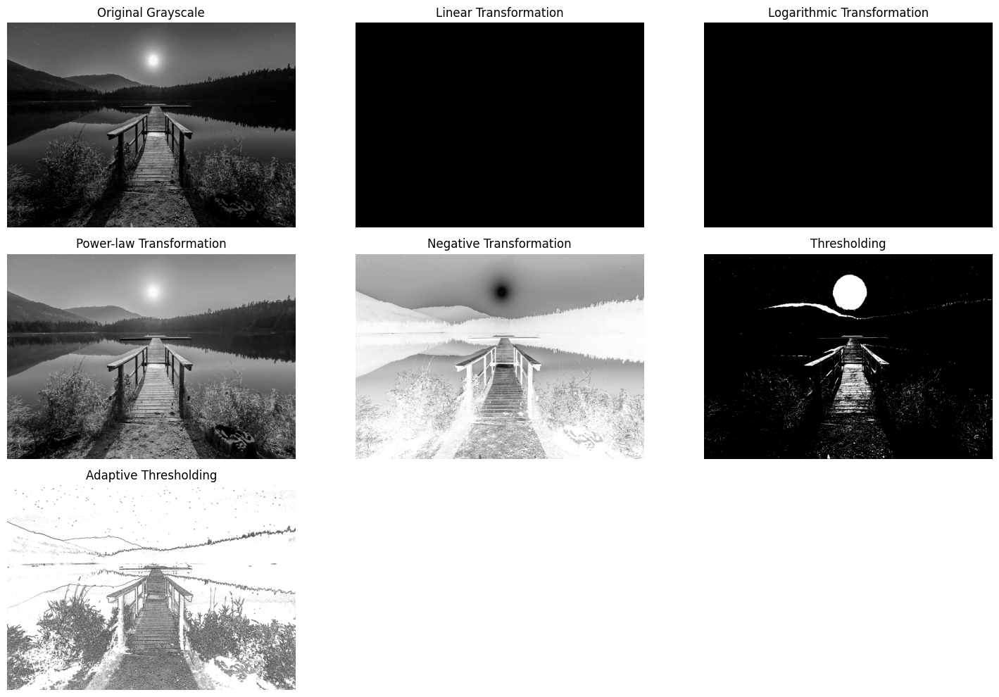

C:\Users\shail\AppData\Local\Temp\ipykernel_3400\3984204225.py:48: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img.ravel(), 256, [0, 256])


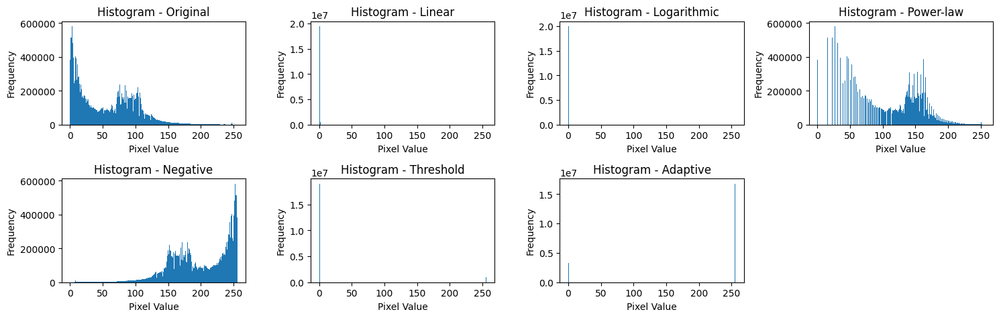


Image Statistics:

Original Image:
Mean: 55.25
Standard Deviation: 44.88
Min Value: 0
Max Value: 255

Linear Image:
Mean: 0.03
Standard Deviation: 0.16
Min Value: 0
Max Value: 1

Logarithmic Image:
Mean: 0.00
Standard Deviation: 0.00
Min Value: 0
Max Value: 0

Power-law Image:
Mean: 104.96
Standard Deviation: 54.40
Min Value: 0
Max Value: 255

Negative Image:
Mean: 199.75
Standard Deviation: 44.88
Min Value: 0
Max Value: 255

Threshold Image:
Mean: 12.74
Standard Deviation: 55.56
Min Value: 0
Max Value: 255

Adaptive Image:
Mean: 213.74
Standard Deviation: 93.91
Min Value: 0
Max Value: 255


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_gray_level_transformations(image):
    """
    Apply various gray-level transformations to the image
    """
    # Convert to grayscale if image is color
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    # 1. Linear Transformation (Contrast Stretching)
    min_val = np.min(gray)
    max_val = np.max(gray)
    linear_transformed = np.uint8(255 * (gray - min_val) / (max_val - min_val))
    
    # 2. Logarithmic Transformation
    c = 255 / np.log(1 + np.max(gray))
    log_transformed = np.uint8(c * np.log(1 + gray))
    
    # 3. Power-law (Gamma) Transformation
    gamma = 0.5  # gamma < 1 for darker image, gamma > 1 for brighter image
    power_transformed = np.uint8(255 * np.power(gray/255, gamma))
    
    # 4. Negative Transformation
    negative = 255 - gray
    
    # 5. Thresholding
    _, threshold = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    
    # 6. Adaptive Thresholding
    adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                          cv2.THRESH_BINARY, 11, 2)
    
    return (gray, linear_transformed, log_transformed, power_transformed,
            negative, threshold, adaptive_thresh)

def plot_histograms(images, titles):
    """
    Plot histograms for multiple images
    """
    plt.figure(figsize=(15, 5))
    for i, (img, title) in enumerate(zip(images, titles), 1):
        plt.subplot(2, 4, i)
        plt.hist(img.ravel(), 256, [0, 256])
        plt.title(f'Histogram - {title}')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

def main():
    # Read the image
    image = cv2.imread('./image.png')
    if image is None:
        print('Error: Could not load image')
        return
    
    # Apply transformations
    results = apply_gray_level_transformations(image)
    gray, linear, log, power, negative, threshold, adaptive = results
    
    # Convert results to RGB for display
    gray_rgb = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)
    linear_rgb = cv2.cvtColor(linear, cv2.COLOR_GRAY2RGB)
    log_rgb = cv2.cvtColor(log, cv2.COLOR_GRAY2RGB)
    power_rgb = cv2.cvtColor(power, cv2.COLOR_GRAY2RGB)
    negative_rgb = cv2.cvtColor(negative, cv2.COLOR_GRAY2RGB)
    threshold_rgb = cv2.cvtColor(threshold, cv2.COLOR_GRAY2RGB)
    adaptive_rgb = cv2.cvtColor(adaptive, cv2.COLOR_GRAY2RGB)
    
    # Display results
    plt.figure(figsize=(15, 10))
    
    # Original grayscale image
    plt.subplot(331)
    plt.imshow(gray_rgb, cmap='gray')
    plt.title('Original Grayscale')
    plt.axis('off')
    
    # Linear transformation
    plt.subplot(332)
    plt.imshow(linear_rgb, cmap='gray')
    plt.title('Linear Transformation')
    plt.axis('off')
    
    # Logarithmic transformation
    plt.subplot(333)
    plt.imshow(log_rgb, cmap='gray')
    plt.title('Logarithmic Transformation')
    plt.axis('off')
    
    # Power-law transformation
    plt.subplot(334)
    plt.imshow(power_rgb, cmap='gray')
    plt.title('Power-law Transformation')
    plt.axis('off')
    
    # Negative transformation
    plt.subplot(335)
    plt.imshow(negative_rgb, cmap='gray')
    plt.title('Negative Transformation')
    plt.axis('off')
    
    # Thresholding
    plt.subplot(336)
    plt.imshow(threshold_rgb, cmap='gray')
    plt.title('Thresholding')
    plt.axis('off')
    
    # Adaptive thresholding
    plt.subplot(337)
    plt.imshow(adaptive_rgb, cmap='gray')
    plt.title('Adaptive Thresholding')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Plot histograms
    plot_histograms(results, ['Original', 'Linear', 'Logarithmic', 'Power-law',
                             'Negative', 'Threshold', 'Adaptive'])
    
    # Calculate and display statistics
    print("\nImage Statistics:")
    for i, (img, title) in enumerate(zip(results, ['Original', 'Linear', 'Logarithmic', 'Power-law',
                                                  'Negative', 'Threshold', 'Adaptive'])):
        print(f"\n{title} Image:")
        print(f"Mean: {np.mean(img):.2f}")
        print(f"Standard Deviation: {np.std(img):.2f}")
        print(f"Min Value: {np.min(img)}")
        print(f"Max Value: {np.max(img)}")

if __name__ == "__main__":
    main()

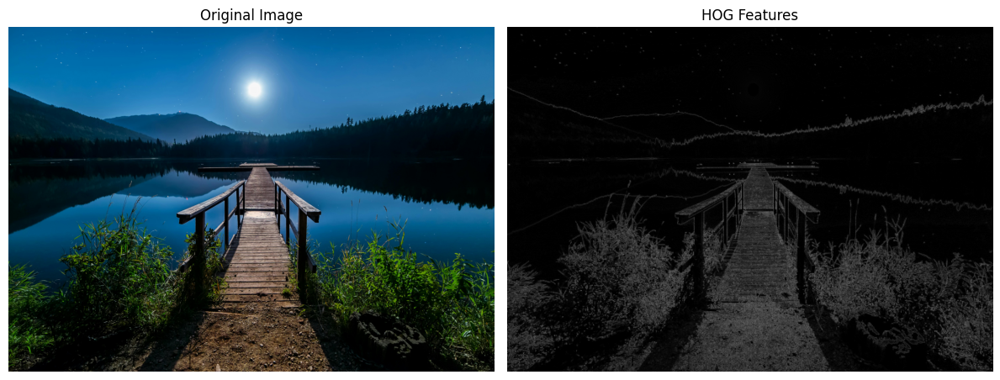


HOG Feature Analysis:
Total number of HOG features: 11201040
Feature vector shape: (11201040,)
Mean feature value: 0.0983
Standard deviation: 0.1316
Min feature value: 0.0000
Max feature value: 1.0000


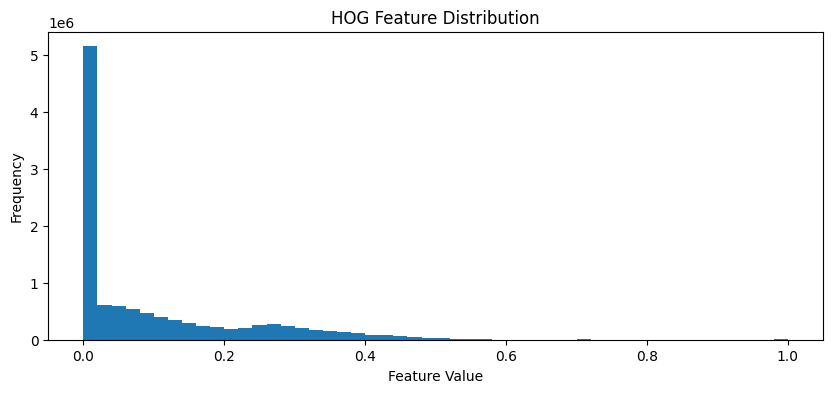


HOG features saved to 'hog_features.npy'
HOG visualization saved to 'hog_visualization.png'


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

def compute_hog_features(image):
    """
    Compute HOG features and their visualization
    """
    # Convert to grayscale if image is color
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    # Compute HOG features
    # Parameters:
    # - orientations: Number of orientation bins
    # - pixels_per_cell: Size of a cell
    # - cells_per_block: Number of cells in each block
    # - visualize: Whether to return HOG image
    # - feature_vector: Whether to return features as a 1D array
    hog_features, hog_image = hog(gray, 
                                 orientations=9,
                                 pixels_per_cell=(8, 8),
                                 cells_per_block=(2, 2),
                                 visualize=True,
                                 feature_vector=True)
    
    # Rescale histogram for better visualization
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    
    return hog_features, hog_image_rescaled

def visualize_hog_features(image, hog_image):
    """
    Visualize original image and HOG features
    """
    # Convert original image to RGB for display
    if len(image.shape) == 3:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    
    # Create figure with two subplots
    plt.figure(figsize=(12, 5))
    
    # Original image
    plt.subplot(121)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    # HOG features
    plt.subplot(122)
    plt.imshow(hog_image, cmap='gray')
    plt.title('HOG Features')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def analyze_hog_features(hog_features):
    """
    Analyze and print information about HOG features
    """
    print("\nHOG Feature Analysis:")
    print(f"Total number of HOG features: {len(hog_features)}")
    print(f"Feature vector shape: {hog_features.shape}")
    print(f"Mean feature value: {np.mean(hog_features):.4f}")
    print(f"Standard deviation: {np.std(hog_features):.4f}")
    print(f"Min feature value: {np.min(hog_features):.4f}")
    print(f"Max feature value: {np.max(hog_features):.4f}")
    
    # Plot HOG feature histogram
    plt.figure(figsize=(10, 4))
    plt.hist(hog_features, bins=50)
    plt.title('HOG Feature Distribution')
    plt.xlabel('Feature Value')
    plt.ylabel('Frequency')
    plt.show()

def main():
    # Read the image
    image = cv2.imread('./image.png')
    if image is None:
        print('Error: Could not load image')
        return
    
    # Compute HOG features
    hog_features, hog_image = compute_hog_features(image)
    
    # Visualize results
    visualize_hog_features(image, hog_image)
    
    # Analyze HOG features
    analyze_hog_features(hog_features)
    
    # Save HOG features to file
    np.save('hog_features.npy', hog_features)
    print("\nHOG features saved to 'hog_features.npy'")
    
    # Optional: Save HOG visualization
    cv2.imwrite('hog_visualization.png', (hog_image * 255).astype(np.uint8))
    print("HOG visualization saved to 'hog_visualization.png'")

if __name__ == "__main__":
    main()

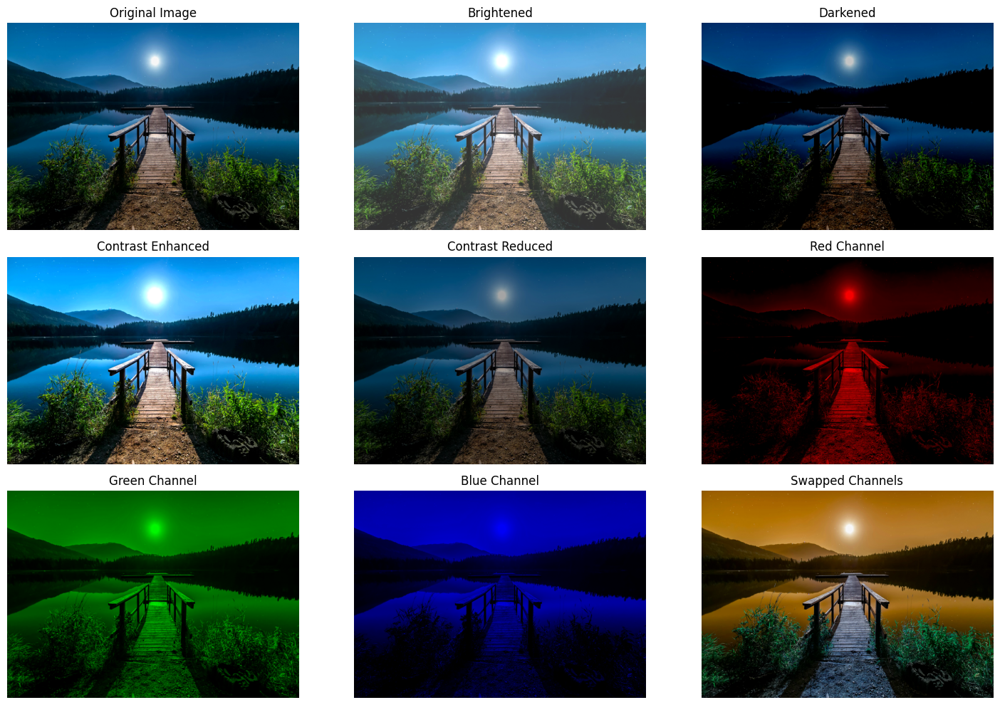

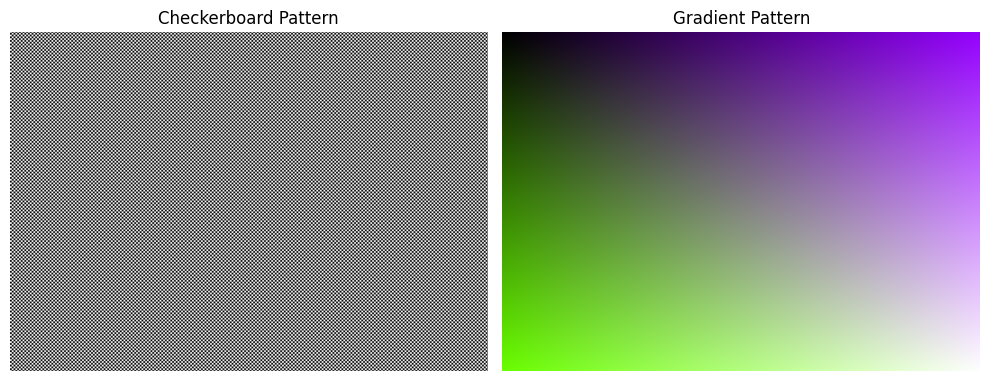


Image Statistics:
Original image shape: (3770, 5306, 3)
Original image dtype: uint8
Original image min value: 0
Original image max value: 255
Original image mean value: 57.61


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def perform_pixel_operations(image):
    """
    Perform various arithmetic operations on pixels
    """
    # Create a copy of the image for operations
    img = image.copy()
    
    # 1. Addition (brightening)
    brightened = cv2.add(img, 50)  # Add 50 to each pixel value
    
    # 2. Subtraction (darkening)
    darkened = cv2.subtract(img, 50)  # Subtract 50 from each pixel value
    
    # 3. Multiplication (contrast enhancement)
    contrast = cv2.multiply(img, 1.5)  # Multiply each pixel by 1.5
    
    # 4. Division (contrast reduction)
    reduced = cv2.divide(img, 1.5)  # Divide each pixel by 1.5
    
    return brightened, darkened, contrast, reduced

def manipulate_color_channels(image):
    """
    Split and manipulate color channels
    """
    # Split channels
    b, g, r = cv2.split(image)
    
    # Create different channel combinations
    # 1. Red channel only
    red_channel = cv2.merge([np.zeros_like(b), np.zeros_like(g), r])
    
    # 2. Green channel only
    green_channel = cv2.merge([np.zeros_like(b), g, np.zeros_like(r)])
    
    # 3. Blue channel only
    blue_channel = cv2.merge([b, np.zeros_like(g), np.zeros_like(r)])
    
    # 4. Swap red and blue channels
    swapped = cv2.merge([r, g, b])
    
    return red_channel, green_channel, blue_channel, swapped

def manipulate_individual_pixels(image):
    """
    Manipulate individual pixels in the image
    """
    # Create a copy of the image
    img = image.copy()
    
    # Get image dimensions
    height, width = img.shape[:2]
    
    # 1. Create a checkerboard pattern
    for i in range(0, height, 20):
        for j in range(0, width, 20):
            if (i + j) % 40 == 0:
                img[i:i+20, j:j+20] = [255, 255, 255]  # White
            else:
                img[i:i+20, j:j+20] = [0, 0, 0]  # Black
    
    # 2. Create a gradient pattern
    gradient = np.zeros_like(image)
    for i in range(height):
        for j in range(width):
            gradient[i, j] = [int(255 * j/width), int(255 * i/height), int(255 * (i+j)/(height+width))]
    
    return img, gradient

def main():
    # Read the image
    image = cv2.imread('./image.png')
    if image is None:
        print('Error: Could not load image')
        return
    
    # Convert to RGB for display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Perform pixel operations
    brightened, darkened, contrast, reduced = perform_pixel_operations(image)
    
    # Manipulate color channels
    red_channel, green_channel, blue_channel, swapped = manipulate_color_channels(image)
    
    # Manipulate individual pixels
    checkerboard, gradient = manipulate_individual_pixels(image)
    
    # Convert all results to RGB for display
    brightened_rgb = cv2.cvtColor(brightened, cv2.COLOR_BGR2RGB)
    darkened_rgb = cv2.cvtColor(darkened, cv2.COLOR_BGR2RGB)
    contrast_rgb = cv2.cvtColor(contrast, cv2.COLOR_BGR2RGB)
    reduced_rgb = cv2.cvtColor(reduced, cv2.COLOR_BGR2RGB)
    red_rgb = cv2.cvtColor(red_channel, cv2.COLOR_BGR2RGB)
    green_rgb = cv2.cvtColor(green_channel, cv2.COLOR_BGR2RGB)
    blue_rgb = cv2.cvtColor(blue_channel, cv2.COLOR_BGR2RGB)
    swapped_rgb = cv2.cvtColor(swapped, cv2.COLOR_BGR2RGB)
    checkerboard_rgb = cv2.cvtColor(checkerboard, cv2.COLOR_BGR2RGB)
    gradient_rgb = cv2.cvtColor(gradient, cv2.COLOR_BGR2RGB)
    
    # Display results
    plt.figure(figsize=(15, 10))
    
    # Original image
    plt.subplot(331)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    # Pixel operations
    plt.subplot(332)
    plt.imshow(brightened_rgb)
    plt.title('Brightened')
    plt.axis('off')
    
    plt.subplot(333)
    plt.imshow(darkened_rgb)
    plt.title('Darkened')
    plt.axis('off')
    
    plt.subplot(334)
    plt.imshow(contrast_rgb)
    plt.title('Contrast Enhanced')
    plt.axis('off')
    
    plt.subplot(335)
    plt.imshow(reduced_rgb)
    plt.title('Contrast Reduced')
    plt.axis('off')
    
    # Color channels
    plt.subplot(336)
    plt.imshow(red_rgb)
    plt.title('Red Channel')
    plt.axis('off')
    
    plt.subplot(337)
    plt.imshow(green_rgb)
    plt.title('Green Channel')
    plt.axis('off')
    
    plt.subplot(338)
    plt.imshow(blue_rgb)
    plt.title('Blue Channel')
    plt.axis('off')
    
    plt.subplot(339)
    plt.imshow(swapped_rgb)
    plt.title('Swapped Channels')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Display pixel manipulation results
    plt.figure(figsize=(10, 5))
    
    plt.subplot(121)
    plt.imshow(checkerboard_rgb)
    plt.title('Checkerboard Pattern')
    plt.axis('off')
    
    plt.subplot(122)
    plt.imshow(gradient_rgb)
    plt.title('Gradient Pattern')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print image statistics
    print("\nImage Statistics:")
    print(f"Original image shape: {image.shape}")
    print(f"Original image dtype: {image.dtype}")
    print(f"Original image min value: {np.min(image)}")
    print(f"Original image max value: {np.max(image)}")
    print(f"Original image mean value: {np.mean(image):.2f}")

if __name__ == "__main__":
    main()

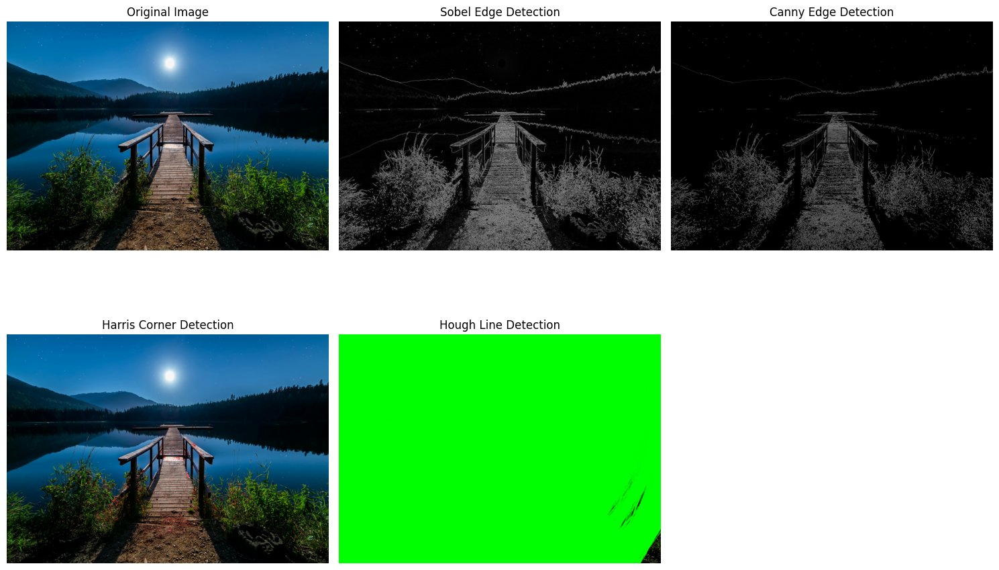

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_features(image_path):
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image could not be loaded")
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 1. Sobel Edge Detection
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = cv2.magnitude(sobel_x, sobel_y)
    sobel_combined = np.uint8(np.absolute(sobel_combined))
    
    # 2. Canny Edge Detection
    canny = cv2.Canny(gray, 100, 200)
    
    # 3. Harris Corner Detection
    harris = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)
    harris = cv2.dilate(harris, None)
    img_harris = img.copy()
    img_harris[harris > 0.01 * harris.max()] = [0, 0, 255]  # Mark corners in red
    
    # 4. Hough Line Detection
    edges = cv2.Canny(gray, 50, 150)
    lines = cv2.HoughLines(edges, 1, np.pi/180, threshold=100)
    img_lines = img.copy()
    
    if lines is not None:
        for rho, theta in lines[:, 0]:
            a = np.cos(theta)
            b = np.sin(theta)
            x0 = a * rho
            y0 = b * rho
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            cv2.line(img_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    # Display results
    plt.figure(figsize=(15, 10))
    
    plt.subplot(231)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(232)
    plt.imshow(sobel_combined, cmap='gray')
    plt.title('Sobel Edge Detection')
    plt.axis('off')
    
    plt.subplot(233)
    plt.imshow(canny, cmap='gray')
    plt.title('Canny Edge Detection')
    plt.axis('off')
    
    plt.subplot(234)
    plt.imshow(cv2.cvtColor(img_harris, cv2.COLOR_BGR2RGB))
    plt.title('Harris Corner Detection')
    plt.axis('off')
    
    plt.subplot(235)
    plt.imshow(cv2.cvtColor(img_lines, cv2.COLOR_BGR2RGB))
    plt.title('Hough Line Detection')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Replace 'input_image.jpg' with your image path
    image_path = './saved_image.jpg'
    try:
        detect_features(image_path)
    except Exception as e:
        print(f"Error: {e}")

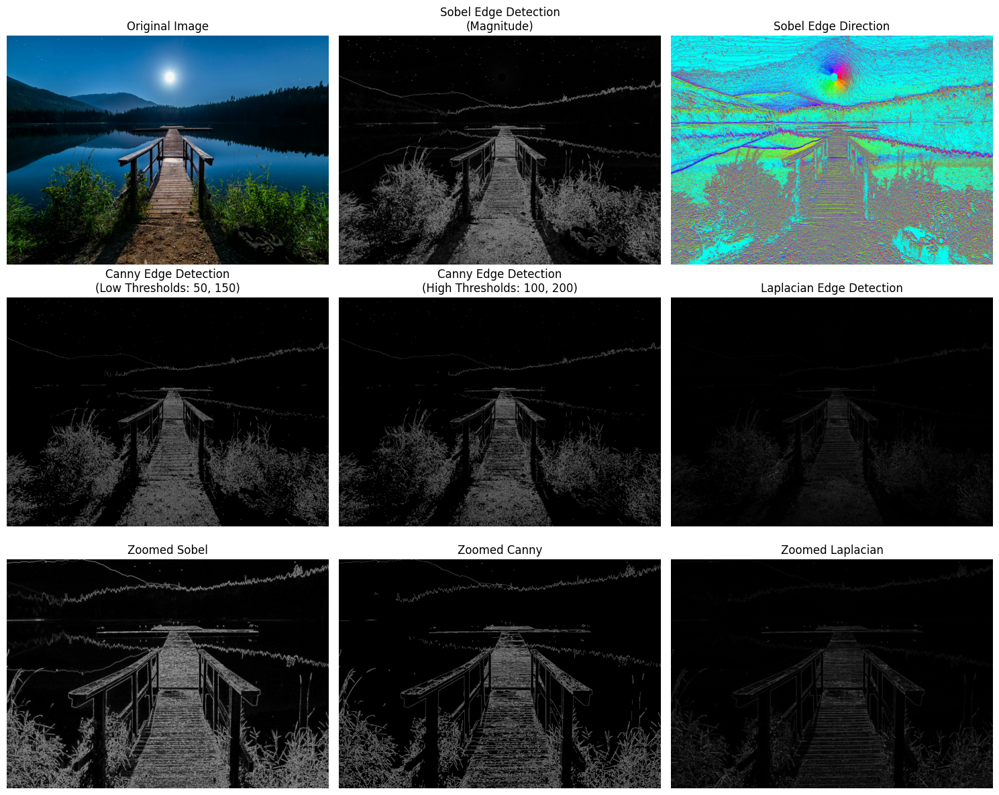


Edge Detection Analysis:
--------------------------------------------------
Sobel Edge Detection:
- Detects edges based on gradient magnitude and direction
- Good at showing edge strength and orientation
- More sensitive to noise compared to Canny

Canny Edge Detection:
- Provides clean, thin edges with good noise suppression
- Uses double thresholding and hysteresis
- Best for detecting true edges with minimal noise

Laplacian Edge Detection:
- Detects rapid intensity changes using second derivatives
- More sensitive to noise (hence pre-smoothing needed)
- Good at finding fine detail and zero crossings


In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def compare_edge_detection(image_path):
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image could not be loaded")
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 1. Sobel Edge Detection
    # Compute gradients in x and y directions
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    
    # Calculate magnitude and direction of gradients
    sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    sobel_magnitude = np.uint8(np.absolute(sobel_magnitude))
    
    # Calculate gradient direction
    sobel_direction = np.arctan2(sobel_y, sobel_x) * (180 / np.pi)
    
    # 2. Canny Edge Detection
    # Try different threshold combinations
    canny_low = cv2.Canny(gray, 50, 150)  # Lower thresholds
    canny_high = cv2.Canny(gray, 100, 200)  # Higher thresholds
    
    # 3. Laplacian Edge Detection
    # Apply Gaussian blur first to reduce noise
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)
    laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
    laplacian = np.uint8(np.absolute(laplacian))
    
    # Create visualization
    plt.figure(figsize=(15, 12))
    
    # Original Image
    plt.subplot(331)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    # Sobel Results
    plt.subplot(332)
    plt.imshow(sobel_magnitude, cmap='gray')
    plt.title('Sobel Edge Detection\n(Magnitude)')
    plt.axis('off')
    
    plt.subplot(333)
    plt.imshow(sobel_direction, cmap='hsv')
    plt.title('Sobel Edge Direction')
    plt.axis('off')
    
    # Canny Results
    plt.subplot(334)
    plt.imshow(canny_low, cmap='gray')
    plt.title('Canny Edge Detection\n(Low Thresholds: 50, 150)')
    plt.axis('off')
    
    plt.subplot(335)
    plt.imshow(canny_high, cmap='gray')
    plt.title('Canny Edge Detection\n(High Thresholds: 100, 200)')
    plt.axis('off')
    
    # Laplacian Results
    plt.subplot(336)
    plt.imshow(laplacian, cmap='gray')
    plt.title('Laplacian Edge Detection')
    plt.axis('off')
    
    # Comparison of methods on a zoomed region
    height, width = gray.shape
    zoom_x, zoom_y = width // 4, height // 4
    zoom_w, zoom_h = width // 2, height // 2
    zoom_region = slice(zoom_y, zoom_y + zoom_h), slice(zoom_x, zoom_x + zoom_w)
    
    plt.subplot(337)
    plt.imshow(sobel_magnitude[zoom_region], cmap='gray')
    plt.title('Zoomed Sobel')
    plt.axis('off')
    
    plt.subplot(338)
    plt.imshow(canny_high[zoom_region], cmap='gray')
    plt.title('Zoomed Canny')
    plt.axis('off')
    
    plt.subplot(339)
    plt.imshow(laplacian[zoom_region], cmap='gray')
    plt.title('Zoomed Laplacian')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print analysis
    print("\nEdge Detection Analysis:")
    print("-" * 50)
    print("Sobel Edge Detection:")
    print("- Detects edges based on gradient magnitude and direction")
    print("- Good at showing edge strength and orientation")
    print("- More sensitive to noise compared to Canny")
    
    print("\nCanny Edge Detection:")
    print("- Provides clean, thin edges with good noise suppression")
    print("- Uses double thresholding and hysteresis")
    print("- Best for detecting true edges with minimal noise")
    
    print("\nLaplacian Edge Detection:")
    print("- Detects rapid intensity changes using second derivatives")
    print("- More sensitive to noise (hence pre-smoothing needed)")
    print("- Good at finding fine detail and zero crossings")

if __name__ == "__main__":
    # Replace 'input_image.jpg' with your image path
    image_path = 'saved_image.jpg'
    try:
        compare_edge_detection(image_path)
    except Exception as e:
        print(f"Error: {e}")

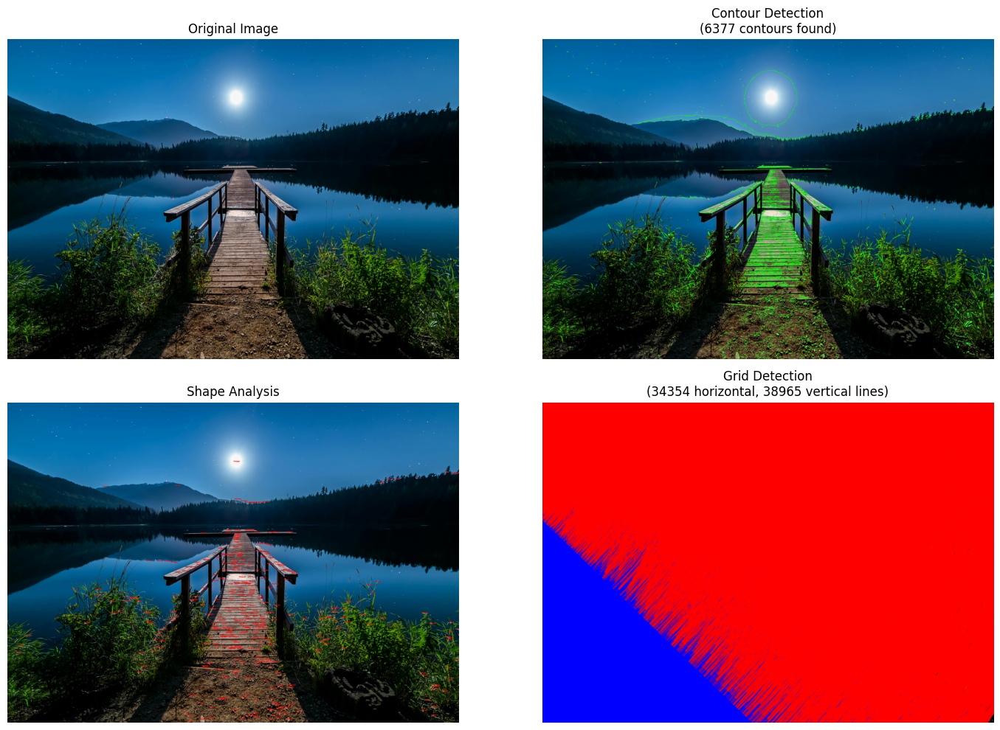


Image Analysis Results:
--------------------------------------------------
Number of contours detected: 6377
Number of grid lines detected:
  - Horizontal lines: 34354
  - Vertical lines: 38965


In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_contours(image):
    """
    Detect and draw contours in the image.
    Returns the original image with contours drawn and hierarchy information.
    """
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Apply threshold
    _, thresh = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY)
    
    # Find contours
    contours, hierarchy = cv2.findContours(
        thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE
    )
    
    # Create a copy of the image to draw contours
    contour_img = image.copy()
    
    # Draw all contours
    cv2.drawContours(contour_img, contours, -1, (0, 255, 0), 2)
    
    # Analyze contours
    analyzed_img = image.copy()
    for i, contour in enumerate(contours):
        # Calculate area and perimeter
        area = cv2.contourArea(contour)
        perimeter = cv2.arcLength(contour, True)
        
        # Skip very small contours
        if area < 100:
            continue
        
        # Approximate the contour shape
        approx = cv2.approxPolyDP(contour, 0.04 * perimeter, True)
        
        # Get the center of the contour
        M = cv2.moments(contour)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            
            # Identify shape based on number of vertices
            vertices = len(approx)
            shape = "Unknown"
            if vertices == 3:
                shape = "Triangle"
            elif vertices == 4:
                # Check if it's a square or rectangle
                x, y, w, h = cv2.boundingRect(approx)
                aspect_ratio = float(w)/h
                if 0.95 <= aspect_ratio <= 1.05:
                    shape = "Square"
                else:
                    shape = "Rectangle"
            elif vertices == 5:
                shape = "Pentagon"
            elif vertices == 6:
                shape = "Hexagon"
            elif vertices > 6:
                shape = "Circle"
            
            # Draw shape name
            cv2.putText(analyzed_img, shape, (cx-20, cy), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
    
    return contour_img, analyzed_img, len(contours)

def detect_grid(image):
    """
    Detect grid patterns in the image using Hough lines.
    """
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply adaptive threshold
    thresh = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
        cv2.THRESH_BINARY, 11, 2
    )
    
    # Detect edges
    edges = cv2.Canny(thresh, 50, 150, apertureSize=3)
    
    # Apply dilation to connect gaps
    kernel = np.ones((3,3), np.uint8)
    dilated = cv2.dilate(edges, kernel, iterations=1)
    
    # Detect lines using Hough transform
    lines = cv2.HoughLines(dilated, 1, np.pi/180, threshold=100)
    
    # Create images for visualization
    hough_lines = image.copy()
    
    if lines is not None:
        # Separate horizontal and vertical lines
        horizontal_lines = []
        vertical_lines = []
        
        for rho, theta in lines[:, 0]:
            # Convert polar coordinates to Cartesian
            a = np.cos(theta)
            b = np.sin(theta)
            x0 = a * rho
            y0 = b * rho
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            
            # Categorize lines as horizontal or vertical
            if abs(theta) < np.pi/4 or abs(theta) > 3*np.pi/4:
                vertical_lines.append((x1, y1, x2, y2))
            else:
                horizontal_lines.append((x1, y1, x2, y2))
        
        # Draw horizontal lines in blue
        for x1, y1, x2, y2 in horizontal_lines:
            cv2.line(hough_lines, (x1, y1), (x2, y2), (255, 0, 0), 2)
        
        # Draw vertical lines in red
        for x1, y1, x2, y2 in vertical_lines:
            cv2.line(hough_lines, (x1, y1), (x2, y2), (0, 0, 255), 2)
    
    return hough_lines, len(horizontal_lines) if lines is not None else 0, len(vertical_lines) if lines is not None else 0

def process_image(image_path):
    """
    Process an image for both contour and grid detection.
    """
    # Read image
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image could not be loaded")
    
    # Detect contours
    contour_img, analyzed_img, num_contours = detect_contours(image)
    
    # Detect grid
    grid_img, num_horizontal, num_vertical = detect_grid(image)
    
    # Display results
    plt.figure(figsize=(15, 10))
    
    # Original image
    plt.subplot(221)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    # Contour detection
    plt.subplot(222)
    plt.imshow(cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Contour Detection\n({num_contours} contours found)')
    plt.axis('off')
    
    # Shape analysis
    plt.subplot(223)
    plt.imshow(cv2.cvtColor(analyzed_img, cv2.COLOR_BGR2RGB))
    plt.title('Shape Analysis')
    plt.axis('off')
    
    # Grid detection
    plt.subplot(224)
    plt.imshow(cv2.cvtColor(grid_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Grid Detection\n({num_horizontal} horizontal, {num_vertical} vertical lines)')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print analysis
    print("\nImage Analysis Results:")
    print("-" * 50)
    print(f"Number of contours detected: {num_contours}")
    print(f"Number of grid lines detected:")
    print(f"  - Horizontal lines: {num_horizontal}")
    print(f"  - Vertical lines: {num_vertical}")

if __name__ == "__main__":
    # Replace 'input_image.jpg' with your image path
    image_path = './saved_image.jpg'
    try:
        process_image(image_path)
    except Exception as e:
        print(f"Error: {e}")

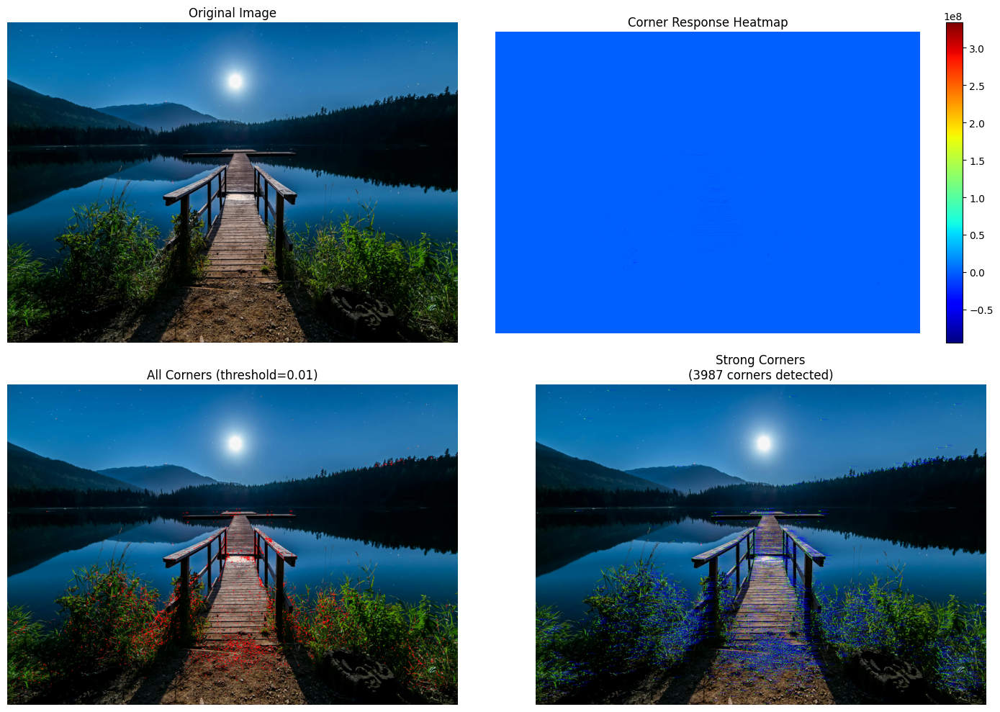


Harris Corner Detection Analysis:
--------------------------------------------------
Parameters used:
  - Block size: 2
  - Kernel size: 3
  - k value: 0.04
  - Threshold ratio: 0.01

Results:
  - Total corners detected: 25981
  - Strong corners after non-max suppression: 3987

Corner Distribution Analysis:
--------------------------------------------------
Mean position: (2684.2, 2750.1)
Standard deviation: (1118.6, 510.8)

Regional distribution:
  - top_left: 78 corners (2.0%)
  - top_right: 167 corners (4.2%)
  - bottom_left: 1803 corners (45.2%)
  - bottom_right: 1939 corners (48.6%)


In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def harris_corner_detection(image_path, block_size=2, ksize=3, k=0.04, threshold_ratio=0.01, 
                          show_all_corners=False):
    """
    Implement Harris Corner Detection with parameter tuning.
    
    Parameters:
    -----------
    image_path : str
        Path to the input image
    block_size : int
        Size of neighborhood considered for corner detection
    ksize : int
        Aperture parameter for Sobel operator
    k : float
        Harris detector free parameter
    threshold_ratio : float
        Threshold ratio for corner detection (relative to maximum corner response)
    show_all_corners : bool
        If True, shows all corners without non-max suppression
    """
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image could not be loaded")
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Convert to float32
    gray = np.float32(gray)
    
    # Apply Harris Corner Detection
    harris_corners = cv2.cornerHarris(gray, blockSize=block_size, ksize=ksize, k=k)
    
    # Dilate corner detections to enhance them
    dilated_corners = cv2.dilate(harris_corners, None)
    
    # Create copies for different visualizations
    basic_corners = image.copy()
    filtered_corners = image.copy()
    
    # Threshold for corner detection
    threshold = threshold_ratio * harris_corners.max()
    
    # Store corner coordinates for non-max suppression
    corner_coordinates = []
    
    # Mark corners and collect coordinates
    for i in range(harris_corners.shape[0]):
        for j in range(harris_corners.shape[1]):
            if harris_corners[i, j] > threshold:
                corner_coordinates.append((j, i, harris_corners[i, j]))  # x, y, response
                if show_all_corners:
                    cv2.circle(basic_corners, (j, i), 3, (0, 0, 255), -1)
    
    # Non-maximum suppression
    def non_max_suppression(corners, window_size=10):
        sorted_corners = sorted(corners, key=lambda x: x[2], reverse=True)
        selected_corners = []
        
        while sorted_corners:
            current = sorted_corners[0]
            selected_corners.append(current)
            
            # Remove corners that are too close to the current corner
            sorted_corners = [
                corner for corner in sorted_corners[1:]
                if abs(corner[0] - current[0]) > window_size or 
                   abs(corner[1] - current[1]) > window_size
            ]
        
        return selected_corners
    
    # Apply non-maximum suppression
    strong_corners = non_max_suppression(corner_coordinates)
    
    # Mark strong corners
    for x, y, response in strong_corners:
        # Draw circles with size proportional to corner response
        radius = int(3 + 2 * (response / harris_corners.max()))
        cv2.circle(filtered_corners, (x, y), radius, (0, 255, 0), 2)
        # Add corner response value
        response_text = f"{response:.2f}"
        cv2.putText(filtered_corners, response_text, (x+5, y-5),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 0, 0), 1)
    
    # Visualization
    plt.figure(figsize=(15, 10))
    
    # Original image
    plt.subplot(221)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    # Corner response heatmap
    plt.subplot(222)
    plt.imshow(harris_corners, cmap='jet')
    plt.title('Corner Response Heatmap')
    plt.colorbar()
    plt.axis('off')
    
    # All corners (if show_all_corners is True)
    plt.subplot(223)
    plt.imshow(cv2.cvtColor(basic_corners, cv2.COLOR_BGR2RGB))
    plt.title(f'All Corners (threshold={threshold_ratio})')
    plt.axis('off')
    
    # Strong corners after non-max suppression
    plt.subplot(224)
    plt.imshow(cv2.cvtColor(filtered_corners, cv2.COLOR_BGR2RGB))
    plt.title(f'Strong Corners\n({len(strong_corners)} corners detected)')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print analysis
    print("\nHarris Corner Detection Analysis:")
    print("-" * 50)
    print(f"Parameters used:")
    print(f"  - Block size: {block_size}")
    print(f"  - Kernel size: {ksize}")
    print(f"  - k value: {k}")
    print(f"  - Threshold ratio: {threshold_ratio}")
    print(f"\nResults:")
    print(f"  - Total corners detected: {len(corner_coordinates)}")
    print(f"  - Strong corners after non-max suppression: {len(strong_corners)}")
    
    return harris_corners, strong_corners

def analyze_corner_distribution(corners, image_shape):
    """
    Analyze the distribution of detected corners in the image.
    """
    if not corners:
        return
    
    # Convert corners to numpy array
    corner_points = np.array([(x, y) for x, y, _ in corners])
    
    # Calculate statistics
    mean_x = np.mean(corner_points[:, 0])
    mean_y = np.mean(corner_points[:, 1])
    std_x = np.std(corner_points[:, 0])
    std_y = np.std(corner_points[:, 1])
    
    # Calculate corner density in different regions
    height, width = image_shape[:2]
    regions = {
        'top_left': [0, width//2, 0, height//2],
        'top_right': [width//2, width, 0, height//2],
        'bottom_left': [0, width//2, height//2, height],
        'bottom_right': [width//2, width, height//2, height]
    }
    
    region_counts = {}
    for region_name, (x1, x2, y1, y2) in regions.items():
        count = sum(1 for x, y, _ in corners 
                   if x1 <= x < x2 and y1 <= y < y2)
        region_counts[region_name] = count
    
    print("\nCorner Distribution Analysis:")
    print("-" * 50)
    print(f"Mean position: ({mean_x:.1f}, {mean_y:.1f})")
    print(f"Standard deviation: ({std_x:.1f}, {std_y:.1f})")
    print("\nRegional distribution:")
    for region, count in region_counts.items():
        percentage = (count / len(corners)) * 100
        print(f"  - {region}: {count} corners ({percentage:.1f}%)")

if __name__ == "__main__":
    # Replace 'input_image.jpg' with your image path
    image_path = 'saved_image.jpg'
    try:
        # Read image for shape information
        image = cv2.imread(image_path)
        if image is None:
            raise ValueError("Image could not be loaded")
        
        # Detect corners with default parameters
        harris_response, detected_corners = harris_corner_detection(
            image_path,
            block_size=2,
            ksize=3,
            k=0.04,
            threshold_ratio=0.01,
            show_all_corners=True
        )
        
        # Analyze corner distribution
        analyze_corner_distribution(detected_corners, image.shape)
        
    except Exception as e:
        print(f"Error: {e}")

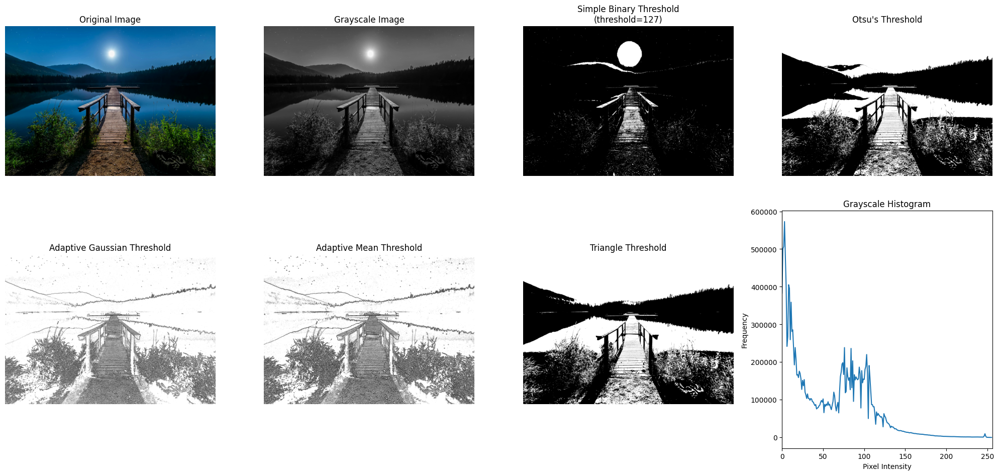


Thresholding Analysis:
--------------------------------------------------
Original Image Statistics:
  - Image Size: (3770, 5306)
  - Min Pixel Value: 0
  - Max Pixel Value: 255
  - Mean Pixel Value: 55.28
  - Standard Deviation: 44.86

Thresholding Results:

Simple Binary Threshold:
  - White Pixels: 4.99%
  - Black Pixels: 95.01%

Otsu Threshold:
  - White Pixels: 47.12%
  - Black Pixels: 52.88%

Adaptive Gaussian Threshold:
  - White Pixels: 83.82%
  - Black Pixels: 16.18%

Adaptive Mean Threshold:
  - White Pixels: 80.49%
  - Black Pixels: 19.51%

Triangle Threshold:
  - White Pixels: 53.26%
  - Black Pixels: 46.74%

Threshold Method Comparisons:
--------------------------------------------------
binary vs otsu:
  - Different pixels: 42.13%
binary vs adaptive_gaussian:
  - Different pixels: 79.64%
binary vs adaptive_mean:
  - Different pixels: 76.20%
binary vs triangle:
  - Different pixels: 48.26%
otsu vs adaptive_gaussian:
  - Different pixels: 43.69%
otsu vs adaptive_mean:
  - 

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_thresholding(image_path):
    """
    Apply different thresholding techniques to an image and compare results.
    
    Parameters:
    -----------
    image_path : str
        Path to the input image
    """
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image could not be loaded")
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # 1. Simple Binary Thresholding
    _, binary_thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    
    # 2. Binary Thresholding with Otsu's method
    _, otsu_thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # 3. Adaptive Gaussian Thresholding
    adaptive_gaussian = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
    )
    
    # 4. Adaptive Mean Thresholding
    adaptive_mean = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2
    )
    
    # 5. Triangle Thresholding
    _, triangle_thresh = cv2.threshold(
        gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_TRIANGLE
    )
    
    # Calculate histogram
    hist = cv2.calcHist([gray], [0], None, [256], [0, 256])
    
    # Create visualization
    plt.figure(figsize=(20, 10))
    
    # Original Image
    plt.subplot(241)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    # Grayscale Image
    plt.subplot(242)
    plt.imshow(gray, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')
    
    # Simple Binary Threshold
    plt.subplot(243)
    plt.imshow(binary_thresh, cmap='gray')
    plt.title('Simple Binary Threshold\n(threshold=127)')
    plt.axis('off')
    
    # Otsu's Threshold
    plt.subplot(244)
    plt.imshow(otsu_thresh, cmap='gray')
    plt.title("Otsu's Threshold")
    plt.axis('off')
    
    # Adaptive Gaussian Threshold
    plt.subplot(245)
    plt.imshow(adaptive_gaussian, cmap='gray')
    plt.title('Adaptive Gaussian Threshold')
    plt.axis('off')
    
    # Adaptive Mean Threshold
    plt.subplot(246)
    plt.imshow(adaptive_mean, cmap='gray')
    plt.title('Adaptive Mean Threshold')
    plt.axis('off')
    
    # Triangle Threshold
    plt.subplot(247)
    plt.imshow(triangle_thresh, cmap='gray')
    plt.title('Triangle Threshold')
    plt.axis('off')
    
    # Histogram
    plt.subplot(248)
    plt.plot(hist)
    plt.title('Grayscale Histogram')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.xlim([0, 256])
    
    plt.tight_layout()
    plt.show()
    
    # Analyze results
    def calculate_threshold_metrics(thresholded_img):
        """Calculate basic metrics for thresholded image"""
        total_pixels = thresholded_img.size
        white_pixels = np.sum(thresholded_img == 255)
        black_pixels = np.sum(thresholded_img == 0)
        return {
            'white_percentage': (white_pixels / total_pixels) * 100,
            'black_percentage': (black_pixels / total_pixels) * 100
        }
    
    # Calculate metrics for each method
    methods = {
        'Simple Binary': binary_thresh,
        'Otsu': otsu_thresh,
        'Adaptive Gaussian': adaptive_gaussian,
        'Adaptive Mean': adaptive_mean,
        'Triangle': triangle_thresh
    }
    
    print("\nThresholding Analysis:")
    print("-" * 50)
    
    # Original image statistics
    print("Original Image Statistics:")
    print(f"  - Image Size: {gray.shape}")
    print(f"  - Min Pixel Value: {gray.min()}")
    print(f"  - Max Pixel Value: {gray.max()}")
    print(f"  - Mean Pixel Value: {gray.mean():.2f}")
    print(f"  - Standard Deviation: {gray.std():.2f}")
    
    print("\nThresholding Results:")
    for method_name, thresholded in methods.items():
        metrics = calculate_threshold_metrics(thresholded)
        print(f"\n{method_name} Threshold:")
        print(f"  - White Pixels: {metrics['white_percentage']:.2f}%")
        print(f"  - Black Pixels: {metrics['black_percentage']:.2f}%")
    
    return {
        'binary': binary_thresh,
        'otsu': otsu_thresh,
        'adaptive_gaussian': adaptive_gaussian,
        'adaptive_mean': adaptive_mean,
        'triangle': triangle_thresh
    }

def analyze_threshold_differences(results):
    """
    Analyze the differences between thresholding methods
    """
    methods = list(results.keys())
    n_methods = len(methods)
    
    print("\nThreshold Method Comparisons:")
    print("-" * 50)
    
    for i in range(n_methods):
        for j in range(i + 1, n_methods):
            method1, method2 = methods[i], methods[j]
            diff = np.sum(results[method1] != results[method2])
            diff_percentage = (diff / results[method1].size) * 100
            print(f"{method1} vs {method2}:")
            print(f"  - Different pixels: {diff_percentage:.2f}%")

if __name__ == "__main__":
    # Replace 'input_image.jpg' with your image path
    image_path = 'saved_image.jpg'
    try:
        # Apply different thresholding methods
        threshold_results = apply_thresholding(image_path)
        
        # Analyze differences between methods
        analyze_threshold_differences(threshold_results)
        
    except Exception as e:
        print(f"Error: {e}")

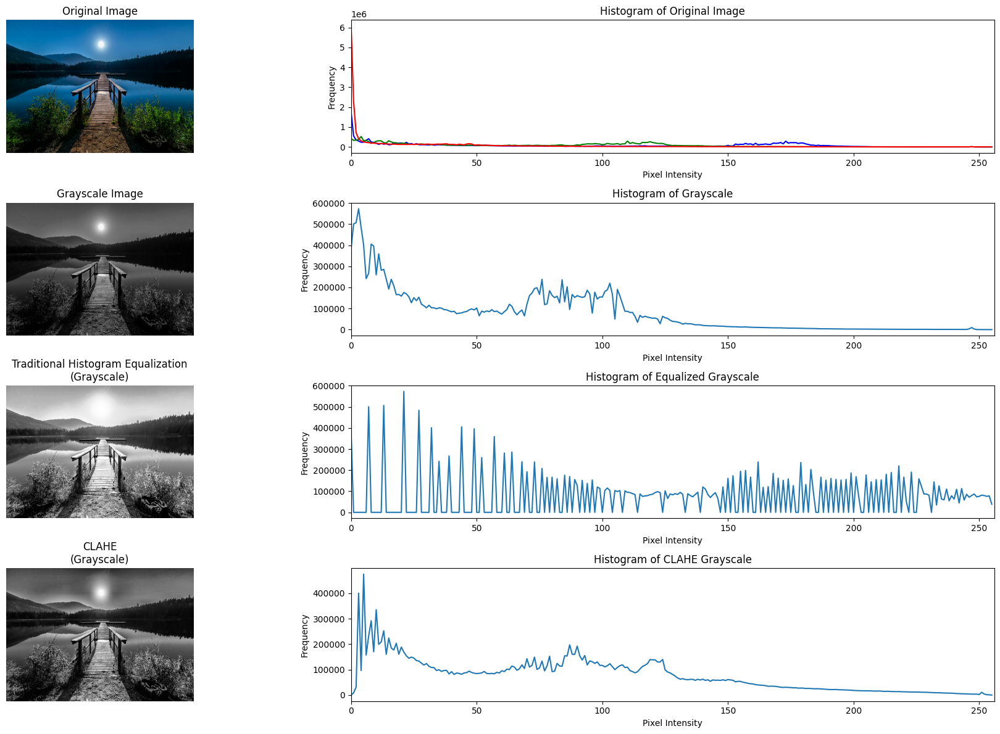

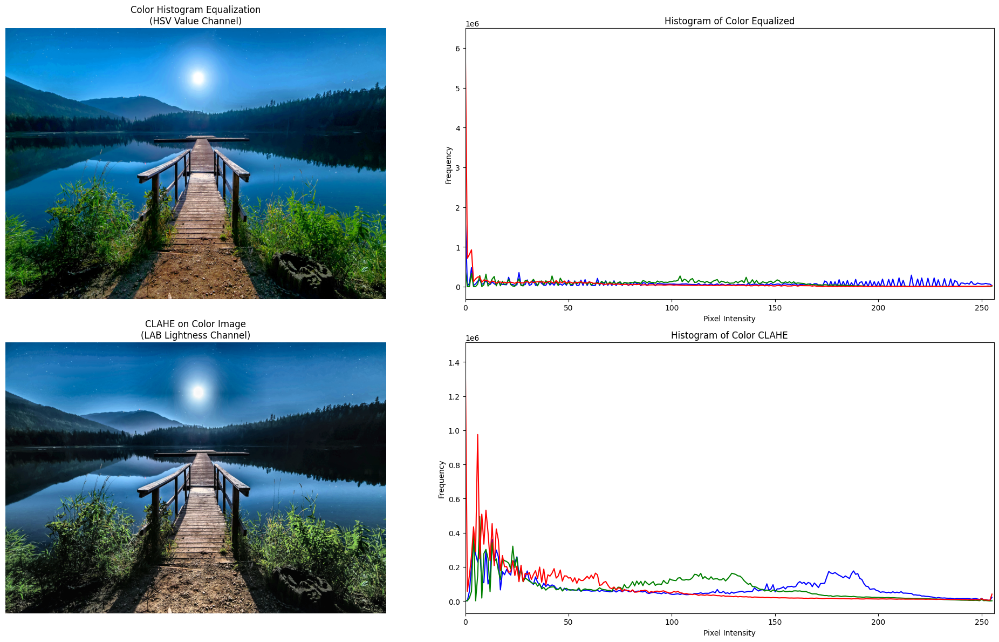


Image Enhancement Analysis:
--------------------------------------------------

Original Grayscale:
  - Min Value: 0
  - Max Value: 255
  - Mean Value: 55.28
  - Standard Deviation: 44.86
  - Entropy: 7.00

Traditional Equalization:
  - Min Value: 0
  - Max Value: 255
  - Mean Value: 126.39
  - Standard Deviation: 74.31
  - Entropy: 6.84

CLAHE:
  - Min Value: 0
  - Max Value: 255
  - Mean Value: 78.14
  - Standard Deviation: 55.88
  - Entropy: 7.51

Enhancement Method Comparisons:
--------------------------------------------------

original vs equalized:
  - Mean Difference: 71.12
  - Maximum Difference: 120.00

original vs clahe:
  - Mean Difference: 24.27
  - Maximum Difference: 105.00

equalized vs clahe:
  - Mean Difference: 48.36
  - Maximum Difference: 151.00


In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_histogram(image, title, subplot):
    """Helper function to plot histogram for an image"""
    if len(image.shape) == 2:  # Grayscale image
        plt.subplot(subplot)
        hist = cv2.calcHist([image], [0], None, [256], [0, 256])
        plt.plot(hist)
        plt.title(f'Histogram of {title}')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.xlim([0, 256])
    else:  # Color image
        colors = ('b', 'g', 'r')
        plt.subplot(subplot)
        for i, color in enumerate(colors):
            hist = cv2.calcHist([image], [i], None, [256], [0, 256])
            plt.plot(hist, color=color)
        plt.title(f'Histogram of {title}')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.xlim([0, 256])

def apply_histogram_processing(image_path):
    """
    Apply different histogram processing techniques to an image.
    
    Parameters:
    -----------
    image_path : str
        Path to the input image
    """
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image could not be loaded")
    
    # Convert BGR to RGB for display
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # 1. Traditional Histogram Equalization (Grayscale)
    equalized_gray = cv2.equalizeHist(gray)
    
    # 2. CLAHE on Grayscale
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    clahe_gray = clahe.apply(gray)
    
    # 3. Color Histogram Equalization (Apply to Value channel in HSV)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hsv[:,:,2] = cv2.equalizeHist(hsv[:,:,2])
    equalized_color = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    
    # 4. CLAHE on Color Image (Apply to Value channel in LAB color space)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    lab_planes = list(cv2.split(lab))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    clahe_color = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    
    # Create visualization
    plt.figure(figsize=(20, 12))
    
    # Original Images and Their Histograms
    plt.subplot(421)
    plt.imshow(rgb_image)
    plt.title('Original Image')
    plt.axis('off')
    
    plot_histogram(image, 'Original Image', 422)
    
    # Grayscale and Its Histogram
    plt.subplot(423)
    plt.imshow(gray, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')
    
    plot_histogram(gray, 'Grayscale', 424)
    
    # Traditional Histogram Equalization Results
    plt.subplot(425)
    plt.imshow(equalized_gray, cmap='gray')
    plt.title('Traditional Histogram Equalization\n(Grayscale)')
    plt.axis('off')
    
    plot_histogram(equalized_gray, 'Equalized Grayscale', 426)
    
    # CLAHE Results
    plt.subplot(427)
    plt.imshow(clahe_gray, cmap='gray')
    plt.title('CLAHE\n(Grayscale)')
    plt.axis('off')
    
    plot_histogram(clahe_gray, 'CLAHE Grayscale', 428)
    
    plt.tight_layout()
    plt.show()
    
    # Create second figure for color results
    plt.figure(figsize=(20, 12))
    
    # Color Histogram Equalization Results
    plt.subplot(221)
    plt.imshow(equalized_color)
    plt.title('Color Histogram Equalization\n(HSV Value Channel)')
    plt.axis('off')
    
    plot_histogram(cv2.cvtColor(equalized_color, cv2.COLOR_RGB2BGR), 
                  'Color Equalized', 222)
    
    # Color CLAHE Results
    plt.subplot(223)
    plt.imshow(clahe_color)
    plt.title('CLAHE on Color Image\n(LAB Lightness Channel)')
    plt.axis('off')
    
    plot_histogram(cv2.cvtColor(clahe_color, cv2.COLOR_RGB2BGR), 
                  'Color CLAHE', 224)
    
    plt.tight_layout()
    plt.show()
    
    # Calculate and return image statistics
    def calculate_image_stats(img):
        if len(img.shape) == 3:
            # For color images, convert to grayscale for statistics
            img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        return {
            'min': img.min(),
            'max': img.max(),
            'mean': img.mean(),
            'std': img.std(),
            'entropy': calculate_entropy(img)
        }
    
    def calculate_entropy(img):
        """Calculate image entropy"""
        hist = cv2.calcHist([img], [0], None, [256], [0, 256])
        hist = hist.ravel() / hist.sum()
        hist = hist[hist > 0]  # Remove zero probabilities
        return -np.sum(hist * np.log2(hist))
    
    # Analyze results
    methods = {
        'Original Grayscale': gray,
        'Traditional Equalization': equalized_gray,
        'CLAHE': clahe_gray
    }
    
    print("\nImage Enhancement Analysis:")
    print("-" * 50)
    
    for method_name, img in methods.items():
        stats = calculate_image_stats(img)
        print(f"\n{method_name}:")
        print(f"  - Min Value: {stats['min']}")
        print(f"  - Max Value: {stats['max']}")
        print(f"  - Mean Value: {stats['mean']:.2f}")
        print(f"  - Standard Deviation: {stats['std']:.2f}")
        print(f"  - Entropy: {stats['entropy']:.2f}")
    
    return {
        'original': gray,
        'equalized': equalized_gray,
        'clahe': clahe_gray,
        'color_equalized': equalized_color,
        'color_clahe': clahe_color
    }

def analyze_enhancement_differences(results):
    """
    Analyze the differences between enhancement methods
    """
    methods = ['original', 'equalized', 'clahe']
    
    print("\nEnhancement Method Comparisons:")
    print("-" * 50)
    
    for i in range(len(methods)):
        for j in range(i + 1, len(methods)):
            method1, method2 = methods[i], methods[j]
            # Calculate absolute differences
            diff = np.abs(results[method1].astype(np.float32) - 
                         results[method2].astype(np.float32))
            mean_diff = np.mean(diff)
            max_diff = np.max(diff)
            
            print(f"\n{method1} vs {method2}:")
            print(f"  - Mean Difference: {mean_diff:.2f}")
            print(f"  - Maximum Difference: {max_diff:.2f}")

if __name__ == "__main__":
    # Replace 'input_image.jpg' with your image path
    image_path = 'saved_image.jpg'
    try:
        # Apply histogram processing methods
        enhancement_results = apply_histogram_processing(image_path)
        
        # Analyze differences between methods
        analyze_enhancement_differences(enhancement_results)
        
    except Exception as e:
        print(f"Error: {e}")

C:\Users\shail\AppData\Local\Temp\ipykernel_3400\2441799613.py:117: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(gray.ravel(), 256, [0, 256])


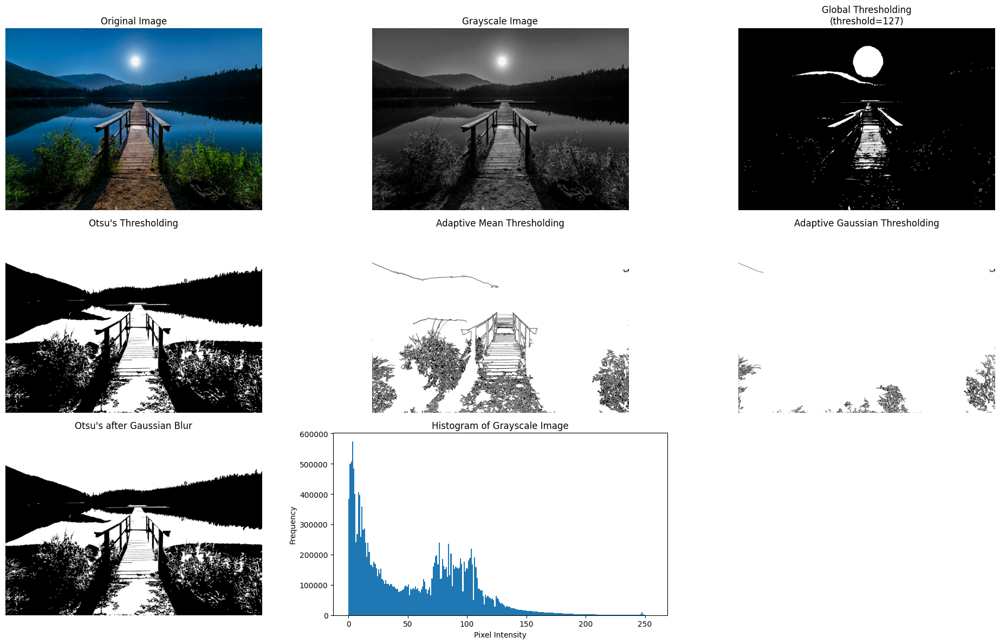


Segmentation Analysis:
--------------------------------------------------

Global Thresholding:
  - Foreground: 4.17%
  - Background: 95.83%
  - Foreground-Background Ratio: 0.044
  - Edge Pixels: 87300

Otsu Thresholding:
  - Foreground: 48.59%
  - Background: 51.41%
  - Foreground-Background Ratio: 0.945
  - Edge Pixels: 316727

Adaptive Mean Thresholding:
  - Foreground: 89.73%
  - Background: 10.27%
  - Foreground-Background Ratio: 8.733
  - Edge Pixels: 622340

Adaptive Gaussian Thresholding:
  - Foreground: 97.98%
  - Background: 2.02%
  - Foreground-Background Ratio: 48.479
  - Edge Pixels: 147689

Otsu with Gaussian Blur Thresholding:
  - Foreground: 48.59%
  - Background: 51.41%
  - Foreground-Background Ratio: 0.945
  - Edge Pixels: 316727

Method Comparisons:
--------------------------------------------------

Global vs Otsu:
  - Different pixels: 44.42%
  - IoU Score: 0.086

Global vs Adaptive Mean:
  - Different pixels: 85.64%
  - IoU Score: 0.046

Global vs Adaptive Gaus

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

def apply_thresholding_techniques(image_path, global_thresh=127):
    """
    Apply different thresholding techniques for image segmentation.
    
    Parameters:
    -----------
    image_path : str
        Path to the input image
    global_thresh : int
        Threshold value for global thresholding (0-255)
    """
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image could not be loaded")
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # 1. Global Thresholding
    _, global_thresh_img = cv2.threshold(blurred, global_thresh, 255, cv2.THRESH_BINARY)
    
    # 2. Otsu's Thresholding
    _, otsu_thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # 3. Adaptive Mean Thresholding
    adaptive_mean = cv2.adaptiveThreshold(
        blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2
    )
    
    # 4. Adaptive Gaussian Thresholding
    adaptive_gaussian = cv2.adaptiveThreshold(
        blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
    )
    
    # 5. Combination: Otsu's after Gaussian blur
    _, otsu_gaussian = cv2.threshold(
        blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )
    
    # Post-processing: Remove small objects and fill holes
    def post_process(binary_img):
        # Remove small objects
        min_size = 100
        labeled_array, num_features = ndimage.label(binary_img)
        sizes = np.bincount(labeled_array.ravel())
        mask_sizes = sizes > min_size
        mask_sizes[0] = 0  # Remove background
        cleaned = mask_sizes[labeled_array]
        
        # Fill holes
        filled = ndimage.binary_fill_holes(cleaned)
        return filled.astype(np.uint8) * 255
    
    # Apply post-processing to all thresholded images
    global_thresh_cleaned = post_process(global_thresh_img)
    otsu_thresh_cleaned = post_process(otsu_thresh)
    adaptive_mean_cleaned = post_process(adaptive_mean)
    adaptive_gaussian_cleaned = post_process(adaptive_gaussian)
    otsu_gaussian_cleaned = post_process(otsu_gaussian)
    
    # Create visualization
    plt.figure(figsize=(20, 12))
    
    # Original Image
    plt.subplot(331)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    # Grayscale Image
    plt.subplot(332)
    plt.imshow(gray, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')
    
    # Global Thresholding
    plt.subplot(333)
    plt.imshow(global_thresh_cleaned, cmap='gray')
    plt.title(f'Global Thresholding\n(threshold={global_thresh})')
    plt.axis('off')
    
    # Otsu's Thresholding
    plt.subplot(334)
    plt.imshow(otsu_thresh_cleaned, cmap='gray')
    plt.title("Otsu's Thresholding")
    plt.axis('off')
    
    # Adaptive Mean Thresholding
    plt.subplot(335)
    plt.imshow(adaptive_mean_cleaned, cmap='gray')
    plt.title('Adaptive Mean Thresholding')
    plt.axis('off')
    
    # Adaptive Gaussian Thresholding
    plt.subplot(336)
    plt.imshow(adaptive_gaussian_cleaned, cmap='gray')
    plt.title('Adaptive Gaussian Thresholding')
    plt.axis('off')
    
    # Otsu's after Gaussian Blur
    plt.subplot(337)
    plt.imshow(otsu_gaussian_cleaned, cmap='gray')
    plt.title("Otsu's after Gaussian Blur")
    plt.axis('off')
    
    # Histogram
    plt.subplot(338)
    plt.hist(gray.ravel(), 256, [0, 256])
    plt.title('Histogram of Grayscale Image')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()
    
    # Calculate metrics for each method
    def calculate_segmentation_metrics(binary_img):
        total_pixels = binary_img.size
        foreground_pixels = np.sum(binary_img == 255)
        background_pixels = np.sum(binary_img == 0)
        
        # Calculate foreground-background ratio
        fg_bg_ratio = foreground_pixels / background_pixels if background_pixels > 0 else float('inf')
        
        # Calculate edge pixels using Canny
        edges = cv2.Canny(binary_img, 100, 200)
        edge_pixels = np.sum(edges > 0)
        
        return {
            'foreground_percentage': (foreground_pixels / total_pixels) * 100,
            'background_percentage': (background_pixels / total_pixels) * 100,
            'fg_bg_ratio': fg_bg_ratio,
            'edge_pixels': edge_pixels
        }
    
    # Analyze results
    methods = {
        'Global': global_thresh_cleaned,
        'Otsu': otsu_thresh_cleaned,
        'Adaptive Mean': adaptive_mean_cleaned,
        'Adaptive Gaussian': adaptive_gaussian_cleaned,
        'Otsu with Gaussian Blur': otsu_gaussian_cleaned
    }
    
    print("\nSegmentation Analysis:")
    print("-" * 50)
    
    for method_name, binary_img in methods.items():
        metrics = calculate_segmentation_metrics(binary_img)
        print(f"\n{method_name} Thresholding:")
        print(f"  - Foreground: {metrics['foreground_percentage']:.2f}%")
        print(f"  - Background: {metrics['background_percentage']:.2f}%")
        print(f"  - Foreground-Background Ratio: {metrics['fg_bg_ratio']:.3f}")
        print(f"  - Edge Pixels: {metrics['edge_pixels']}")
    
    return methods

def compare_methods(segmentation_results):
    """
    Compare the results of different segmentation methods
    """
    methods = list(segmentation_results.keys())
    n_methods = len(methods)
    
    print("\nMethod Comparisons:")
    print("-" * 50)
    
    for i in range(n_methods):
        for j in range(i + 1, n_methods):
            method1, method2 = methods[i], methods[j]
            # Calculate difference between methods
            diff = np.sum(segmentation_results[method1] != segmentation_results[method2])
            diff_percentage = (diff / segmentation_results[method1].size) * 100
            
            print(f"\n{method1} vs {method2}:")
            print(f"  - Different pixels: {diff_percentage:.2f}%")
            
            # Calculate Intersection over Union (IoU)
            intersection = np.sum((segmentation_results[method1] == 255) & 
                                (segmentation_results[method2] == 255))
            union = np.sum((segmentation_results[method1] == 255) | 
                          (segmentation_results[method2] == 255))
            iou = intersection / union if union > 0 else 0
            print(f"  - IoU Score: {iou:.3f}")

if __name__ == "__main__":
    # Replace 'input_image.jpg' with your image path
    image_path = 'saved_image.jpg'
    try:
        # Apply thresholding methods
        segmentation_results = apply_thresholding_techniques(
            image_path,
            global_thresh=127  # Adjust this value based on your image
        )
        
        # Compare different methods
        compare_methods(segmentation_results)
        
    except Exception as e:
        print(f"Error: {e}")

Image loaded successfully


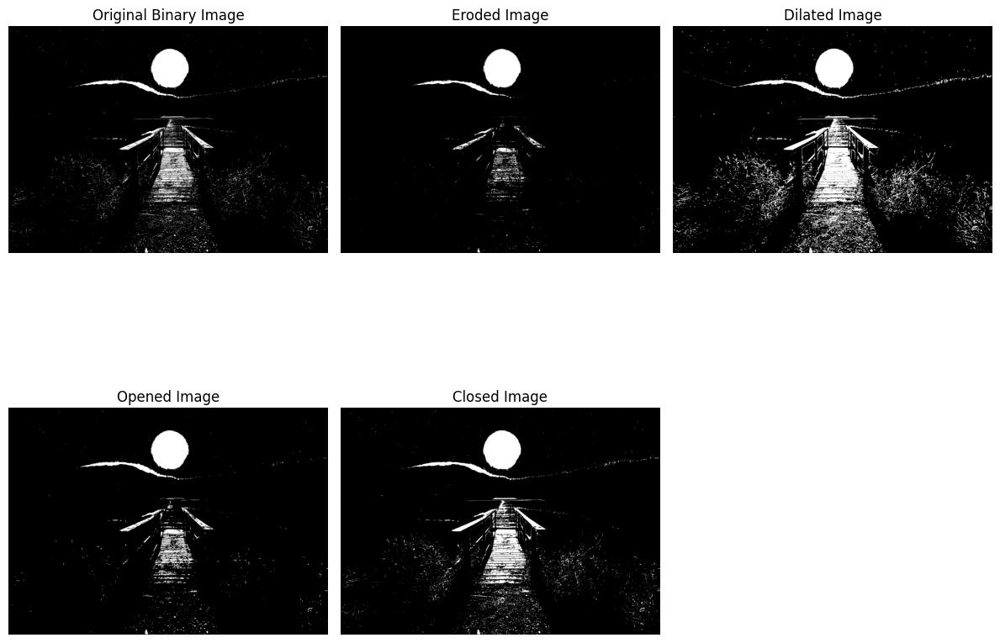

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def main():
    # Read an image
    # Replace 'image.jpg' with your image path
    image = cv2.imread('./image.png', cv2.IMREAD_GRAYSCALE)
    
    # Check if image was successfully loaded
    if image is None:
        print('Error: Could not load image')
        return
    
    print('Image loaded successfully')
    
    # Threshold the image to create a binary image
    _, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
    
    # Define a kernel for morphological operations
    kernel = np.ones((5, 5), np.uint8)
    
    # Perform erosion
    eroded_image = cv2.erode(binary_image, kernel, iterations=1)
    
    # Perform dilation
    dilated_image = cv2.dilate(binary_image, kernel, iterations=1)
    
    # Perform opening (erosion followed by dilation)
    opened_image = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
    
    # Perform closing (dilation followed by erosion)
    closed_image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    
    # Display the results
    plt.figure(figsize=(12, 10))
    
    plt.subplot(231)
    plt.imshow(binary_image, cmap='gray')
    plt.title('Original Binary Image')
    plt.axis('off')
    
    plt.subplot(232)
    plt.imshow(eroded_image, cmap='gray')
    plt.title('Eroded Image')
    plt.axis('off')
    
    plt.subplot(233)
    plt.imshow(dilated_image, cmap='gray')
    plt.title('Dilated Image')
    plt.axis('off')
    
    plt.subplot(234)
    plt.imshow(opened_image, cmap='gray')
    plt.title('Opened Image')
    plt.axis('off')
    
    plt.subplot(235)
    plt.imshow(closed_image, cmap='gray')
    plt.title('Closed Image')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

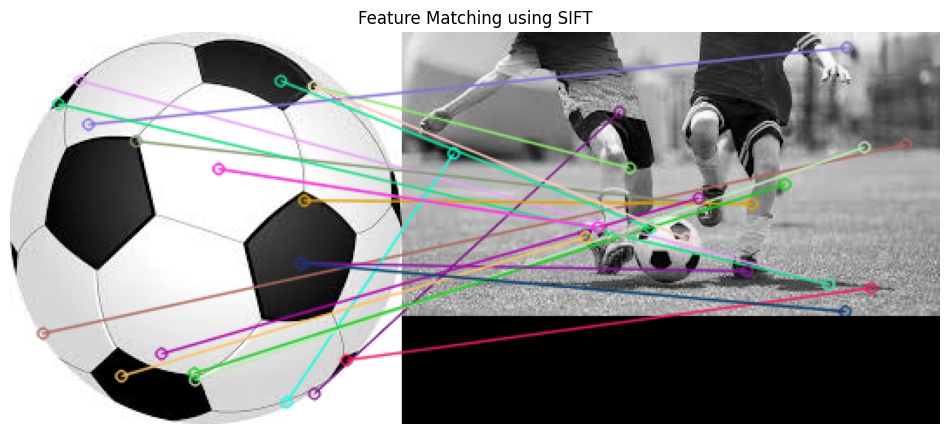

In [16]:
import cv2
import matplotlib.pyplot as plt

def main():
    # Load the query image (object to detect) and the train image (scene)
    query_image = cv2.imread('./ball.png', cv2.IMREAD_GRAYSCALE)
    train_image = cv2.imread('./find.png', cv2.IMREAD_GRAYSCALE)
    
    # Check if images were successfully loaded
    if query_image is None or train_image is None:
        print('Error: Could not load one or both images')
        return
    
    # Initialize the SIFT detector
    sift = cv2.SIFT_create()
    
    # Detect keypoints and compute descriptors
    keypoints_query, descriptors_query = sift.detectAndCompute(query_image, None)
    keypoints_train, descriptors_train = sift.detectAndCompute(train_image, None)
    
    # Use BFMatcher to match descriptors
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(descriptors_query, descriptors_train)
    
    # Sort matches based on their distances
    matches = sorted(matches, key=lambda x: x.distance)
    
    # Draw the top matches
    matched_image = cv2.drawMatches(query_image, keypoints_query, train_image, keypoints_train, matches[:20], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    # Display the matched image
    plt.figure(figsize=(12, 8))
    plt.imshow(matched_image, cmap='gray')
    plt.title('Feature Matching using SIFT')
    plt.axis('off')
    plt.show()

if __name__ == "__main__":
    main()